# Instalaciones

In [1]:
#!pip install rtree
#!pip install pygeos
#!pip install leafmap
#!pip install leaflet
#!pip install geopandas

In [2]:
#%%time 
# Important library for many geopython libraries
#!apt install gdal-bin python-gdal python3-gdal 
# Install rtree - Geopandas requirment
#!apt install python3-rtree 
# Install Geopandas
#!pip install git+git://github.com/geopandas/geopandas.git
# Install descartes - Geopandas requirment
#!pip install descartes 
# Install Folium for Geographic data visualization
#!pip install folium
# Install plotlyExpress
#!pip install plotly_express

# Librerias

## Importar

In [3]:
import pandas as pd
import numpy as np
import geopandas as gpd
from shapely.geometry import Point
import matplotlib
import matplotlib.pyplot as plt 
import folium
import plotly_express as px
import plotly.graph_objects as go
import seaborn as sns
from datetime import datetime

In [4]:
import leafmap  

In [5]:
from folium.plugins import MiniMap

In [6]:
from folium.plugins import DualMap

In [7]:
from folium.plugins import MarkerCluster

In [8]:
from geopandas.tools import sjoin

# Población 2010 y Superficie CABA

In [9]:
url_poblacion_barrio='https://cdn.buenosaires.gob.ar/datosabiertos/datasets/barrios/caba_pob_barrios_2010.csv'

In [10]:
poblacion_barrio_2010=pd.read_csv(url_poblacion_barrio)
poblacion_barrio_2010

,BARRIO,POBLACION
0,AGRONOMIA,13912
1,ALMAGRO,131699
2,BALVANERA,138926
3,BARRACAS,89452
4,BELGRANO,126267
5,BOCA,45113
6,BOEDO,47306
7,CABALLITO,176076
8,CHACARITA,27761
9,COGHLAN,18604


Superficie y perimetros por barrio y comuna

In [11]:
url_superficies='https://cdn.buenosaires.gob.ar/datosabiertos/datasets/barrios/barrios.csv'
superficies_barrio=pd.read_csv(url_superficies)
#superficies_barrio.drop('WKT',axis=1,inplace=True)
superficies_barrio.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48 entries, 0 to 47
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   WKT        48 non-null     object 
 1   barrio     48 non-null     object 
 2   comuna     48 non-null     int64  
 3   perimetro  48 non-null     float64
 4   area       48 non-null     float64
dtypes: float64(2), int64(1), object(2)
memory usage: 2.0+ KB


Unimos poblacion 2010 con la superficie y perimetro de cada barrio

In [12]:
poblacion_barrio_2010_final=poblacion_barrio_2010.merge(superficies_barrio,
                           how='left',
                           left_on='BARRIO',
                           right_on='barrio')
poblacion_barrio_2010_final.drop('barrio',axis=1,inplace=True)
poblacion_barrio_2010_final.area=poblacion_barrio_2010_final.area.round(2)
poblacion_barrio_2010_final.perimetro=poblacion_barrio_2010_final.perimetro.round(2)
poblacion_barrio_2010_final.columns=[i.lower() for i in poblacion_barrio_2010_final.columns]

In [13]:
poblacion_barrio_2010_final.head()

,barrio,poblacion,wkt,comuna,perimetro,area
0,AGRONOMIA,13912,"POLYGON ((-58.4771156675186 -34.5951149914833,...",15,6556.17,2122169.34
1,ALMAGRO,131699,"POLYGON ((-58.4128700313089 -34.6141162515854,...",5,8537.90,4050752.25
2,BALVANERA,138926,"POLYGON ((-58.4119188098038 -34.5980030767748,...",3,8375.82,4342280.27
3,BARRACAS,89452,"POLYGON ((-58.3703353711449 -34.6329258371189,...",4,12789.79,7953453.43
4,BELGRANO,126267,"POLYGON ((-58.4505669109009 -34.5356104340406,...",13,20609.78,7999239.81


# Espacios Verdes CABA

In [14]:
link_espacio_verde='https://cdn.buenosaires.gob.ar/datosabiertos/datasets/secretaria-de-desarrollo-urbano/espacios-verdes/espacio-verde-publico.csv'
data_espacio_verde=pd.read_csv(link_espacio_verde)
data_espacio_verde.head(2)

,WKT,nombre,nombre_ev,clasificac,patio_de_j,apadrinada,observacio,fuente_geo,fuente_ins,ubicacion,...,id_ev_pub,area,perimeter,DGEV_Padri,Mant_2017,TAREAS,ESTADO,SUP_TOTAL,Canil,Posta_aero
0,MULTIPOLYGON (((-58.4453556017045 -34.57924873...,Escuela Scalabrini Ortiz,ESCUELA Nº 13 D.E. 09 SCALABRINI ORTIZ,PLAZOLETA,NO,NaN,Redigitalización en Agosto de 2017. Unión de s...,USIG,USIG,"CONDE - MATIENZO, BENJAMIN, TTE. - FREIRE, RAM...",...,2,1658.266,0.0,NaN,NaN,NaN,NaN,0,NaN,NaN
1,MULTIPOLYGON (((-58.4448074253007 -34.57987067...,Polideportivo Colegiales,POLIDEPORTIVO COLEGIALES,PARQUE,NO,NaN,Redigitalización por USIG en Agosto de 2017. U...,USIG,USIG,"CONDE - MATIENZO, BENJAMIN, TTE. - FREIRE, RAM...",...,6,4686.060,0.0,NaN,NaN,NaN,NaN,0,NaN,NaN


In [15]:
data_espacio_verde.columns=data_espacio_verde.columns.str.lower()
data_espacio_verde.columns

Index(['wkt', 'nombre', 'nombre_ev', 'clasificac', 'patio_de_j', 'apadrinada',
       'observacio', 'fuente_geo', 'fuente_ins', 'ubicacion', 'decreto',
       'fecha_decr', 'ordenanza_', 'fecha_orde', 'boletin_of', 'fecha_bole',
       'barrio', 'comuna', 'fech_padri', 'vig_padri', 'alc_conven', 'nom_mapa',
       'id_ev_pub', 'area', 'perimeter', 'dgev_padri', 'mant_2017', 'tareas',
       'estado', 'sup_total', 'canil', 'posta_aero'],
      dtype='object')

In [16]:
data_espacio_verde['barrio'].unique()

array(['COLEGIALES', 'BELGRANO', 'PALERMO', 'SAAVEDRA',
       'PARQUE AVELLANEDA', 'VILLA ORTUZAR', 'VILLA DEL PARQUE', 'FLORES',
       'VILLA SOLDATI', 'CABALLITO', 'VILLA LUGANO', 'MATADEROS',
       'LINIERS', 'VILLA RIACHUELO', 'VILLA URQUIZA', 'NUEVA POMPEYA',
       'PATERNAL', 'VILLA REAL', 'PARQUE PATRICIOS', 'PARQUE CHACABUCO',
       'SAN CRISTOBAL', 'VILLA GRAL. MITRE', 'ALMAGRO', 'SAN TELMO',
       'RETIRO', 'RECOLETA', 'VERSALLES', 'SAN NICOLAS', 'PUERTO MADERO',
       'MONSERRAT', 'VILLA DEVOTO', 'FLORESTA', 'BALVANERA', 'CHACARITA',
       'VELEZ SARSFIELD', 'VILLA LURO', 'CONSTITUCION',
       'VILLA SANTA RITA', 'BARRACAS', 'NUÑEZ', 'PARQUE CHAS',
       'VILLA CRESPO', 'VILLA PUEYRREDON', 'BOCA', 'BOEDO',
       'MONTE CASTRO', 'COGHLAN', 'AGRONOMIA', 'BALBANERA', nan,
       'VÉLEZ SÁRSFIELD'], dtype=object)

## Completamos los barrios vacios

In [17]:
data_espacio_verde.loc[data_espacio_verde['barrio'].isnull(),:]['ubicacion']

1418                                    NOGOYA - IRIGOYEN
1491    BERGANTIN NANCY ENTRE GOLETA MALDONADO y SUMAC...
1492    BERGANTIN NANCY ENTRE GOLETA MALDONADO y SUMAC...
1494    CAFAYATE AV - BERGANTIN GENERAL BELGRANO - CAÑ...
1495    LISANDRO DE LA TORRE AV - FRAGATA 25 DE MAYO -...
1648    MADERO EDUARDO AV - PERON JUAN DOMINGO TTE - R...
Name: ubicacion, dtype: object

In [18]:
data_espacio_verde.loc[1418 ,'barrio']='VILLA REAL'
data_espacio_verde.loc[1491 ,'barrio']='VILLA RIACHUELO'
data_espacio_verde.loc[1492 ,'barrio']='VILLA RIACHUELO'
data_espacio_verde.loc[1494 ,'barrio']='VILLA RIACHUELO'
data_espacio_verde.loc[1495 ,'barrio']='VILLA RIACHUELO'
data_espacio_verde.loc[1648 ,'barrio']='PUERTO MADERO'
data_espacio_verde.loc[data_espacio_verde['barrio'].isnull(),:]['ubicacion']

Series([], Name: ubicacion, dtype: object)

Cambiamos los barrios mal escritos

In [19]:
data_espacio_verde.loc[data_espacio_verde['barrio']=='BALBANERA','barrio']='BALVANERA'
data_espacio_verde.loc[data_espacio_verde['barrio']=='VÉLEZ SÁRSFIELD','barrio']='VELEZ SARSFIELD'

Borramos la general paz, no corresponde

In [20]:
data_espacio_verde.sort_values('area',ascending=False)[['barrio','area','ubicacion','nombre']][:5]
#BORRAR VILLA REAL OUTLIER GENERAL PAZ

,barrio,area,ubicacion,nombre
1056,PUERTO MADERO,2352162.397,"NOEL, CARLOS M., INT., AV. - RIO DE LA PLATA -...",Reserva Ecológica
473,VILLA REAL,1076581.106,NaN,Gral. Paz
729,VILLA SOLDATI,906759.750,"LACARRA, AV. - ESCALADA, AV. - CASTAÑARES, AV....",Parque Indoamericano
1344,VILLA SOLDATI,794299.938,NaN,Pque. Polidep. Pdte. Julio A. Roca
894,VILLA LUGANO,753829.274,"LARRAZABAL, AV. - FERNANDEZ DE LA CRUZ, FRANCI...",Parque de las Victorias


In [21]:
data_espacio_verde.drop(473,inplace=True)
data_espacio_verde.reset_index(drop=True,inplace=True)

In [22]:
#agregamos los datos vacios de area segun la clasificacion del gobierno de buenos aires
data_espacio_verde.loc[(data_espacio_verde['area']==0) & (data_espacio_verde['clasificac']=='PLAZOLETA') ,'area']=78.90
data_espacio_verde.loc[(data_espacio_verde['area']==0) & (data_espacio_verde['clasificac']=='PLAZA') ,'area']=386.30

In [23]:
data_espacio_verde.groupby(['barrio','clasificac'],as_index=False)['area'].sum()

,barrio,clasificac,area
0,AGRONOMIA,PLAZA,1487.637
1,AGRONOMIA,PLAZOLETA,1345.905
2,ALMAGRO,PATIO RECREATIVO,208.247
3,ALMAGRO,PLAZA,7513.156
4,ALMAGRO,PLAZOLETA,1477.396
...,...,...,...
188,VILLA SOLDATI,PLAZA,25918.512
189,VILLA SOLDATI,PLAZOLETA,64925.454
190,VILLA URQUIZA,CANTERO CENTRAL,4940.958
191,VILLA URQUIZA,PLAZA,14447.291


In [24]:
#hacemos el dataframe final para poder unir con los barrios y tener los datos en un solo dataframe

data_espacio_verde_barrio=data_espacio_verde.groupby(['barrio'],as_index=False)['area'].sum().rename({'area':'superficie_verde'},axis=1)
data_espacio_verde_barrio

,barrio,superficie_verde
0,AGRONOMIA,2833.542
1,ALMAGRO,9198.799
2,BALVANERA,30755.787
3,BARRACAS,225939.635
4,BELGRANO,1278224.942
5,BOCA,102472.372
6,BOEDO,12126.601
7,CABALLITO,215874.599
8,CHACARITA,93385.211
9,COGHLAN,17422.862


## Unimos los dataframes con barrios y superficies verdes

In [25]:
DF_FINAL=poblacion_barrio_2010_final.merge(data_espacio_verde_barrio,
                                 how='left',
                                 on='barrio')

DF_FINAL['sup_verde/hab']=round(DF_FINAL['superficie_verde']/DF_FINAL['poblacion'],2)
DF_FINAL['sup_verde/sup']=round(DF_FINAL['superficie_verde']/DF_FINAL['area'],2)

DF_FINAL

,barrio,poblacion,wkt,comuna,perimetro,area,superficie_verde,sup_verde/hab,sup_verde/sup
0,AGRONOMIA,13912,"POLYGON ((-58.4771156675186 -34.5951149914833,...",15,6556.17,2122169.34,2833.542,0.20,0.00
1,ALMAGRO,131699,"POLYGON ((-58.4128700313089 -34.6141162515854,...",5,8537.90,4050752.25,9198.799,0.07,0.00
2,BALVANERA,138926,"POLYGON ((-58.4119188098038 -34.5980030767748,...",3,8375.82,4342280.27,30755.787,0.22,0.01
3,BARRACAS,89452,"POLYGON ((-58.3703353711449 -34.6329258371189,...",4,12789.79,7953453.43,225939.635,2.53,0.03
4,BELGRANO,126267,"POLYGON ((-58.4505669109009 -34.5356104340406,...",13,20609.78,7999239.81,1278224.942,10.12,0.16
5,BOCA,45113,"POLYGON ((-58.3542882851118 -34.6297737886867,...",4,20060.00,5036240.45,102472.372,2.27,0.02
6,BOEDO,47306,"POLYGON ((-58.411779314803 -34.6303558693605,-...",5,6602.51,2609850.88,12126.601,0.26,0.00
7,CABALLITO,176076,"POLYGON ((-58.4306058283309 -34.6070470885963,...",6,10990.96,6851028.91,215874.599,1.23,0.03
8,CHACARITA,27761,"POLYGON ((-58.4528200492791 -34.5959886570639,...",15,7724.85,3115707.11,93385.211,3.36,0.03
9,COGHLAN,18604,"POLYGON ((-58.4724205132861 -34.5660977127668,...",12,4627.56,1279951.37,17422.862,0.94,0.01


In [26]:
data_espacio_verde_barrio['%'] = ''

In [27]:
data_espacio_verde_barrio['%']  =(data_espacio_verde_barrio['superficie_verde'] /data_espacio_verde_barrio['superficie_verde'].sum()) * 100

In [28]:
data_espacio_verde_barrio

,barrio,superficie_verde,%
0,AGRONOMIA,2833.542,0.018626
1,ALMAGRO,9198.799,0.060469
2,BALVANERA,30755.787,0.202174
3,BARRACAS,225939.635,1.485219
4,BELGRANO,1278224.942,8.402439
5,BOCA,102472.372,0.673604
6,BOEDO,12126.601,0.079714
7,CABALLITO,215874.599,1.419056
8,CHACARITA,93385.211,0.613870
9,COGHLAN,17422.862,0.114530


In [29]:
#DF_FINAL.to_csv(r'C:\Users\Ariel\Google Drive\EANT\Data Analytics con Python\Trabajo Final\DF_FINAL.csv')

## Estaciones Bicis Mapa

In [30]:
url_bicis = 'https://cdn.buenosaires.gob.ar/datosabiertos/datasets/transporte/estaciones-bicicletas-publicas/nuevas-estaciones-bicicletas-publicas.csv'
estaciones = pd.read_csv(url_bicis)
estaciones.head()

,WKT,id,codigo,nombre,ubicacion,tipo,horario,anclajes_t
0,POINT (-58.3747109506359 -34.5924239181221),2,2,002 - Retiro I,"Ramos Mejia, Jose Maria, Dr. Av. & Del Liberta...",AUTOMÁTICA,Estación automática: disponibilidad las 24 horas,20
1,POINT (-58.368256111128 -34.611033074021),3,3,003 - ADUANA,Moreno & Av Paseo Colon,AUTOMÁTICA,Estación automática: disponibilidad las 24 horas,20
2,POINT (-58.3687766674259 -34.6018228613782),4,4,004 - Plaza Roma,Lavalle & Bouchard,AUTOMÁTICA,Estación automática: disponibilidad las 24 horas,20
3,POINT (-58.420951914897 -34.5805498216605),5,5,005 - Plaza Italia,Av. Sarmiento 2601,AUTOMÁTICA,Estación automática: disponibilidad las 24 horas,42
4,POINT (-58.3697538990917 -34.6285274659984),6,6,006 - Parque Lezama,"Avenida Martin Garcia, 295",AUTOMÁTICA,Estación automática: disponibilidad las 24 horas,20


# Estaciones de ECOBICI en CABA

In [31]:
estaciones.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 229 entries, 0 to 228
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   WKT         229 non-null    object
 1   id          229 non-null    int64 
 2   codigo      229 non-null    int64 
 3   nombre      229 non-null    object
 4   ubicacion   229 non-null    object
 5   tipo        229 non-null    object
 6   horario     229 non-null    object
 7   anclajes_t  229 non-null    int64 
dtypes: int64(3), object(5)
memory usage: 14.4+ KB


In [32]:
estaciones_filtrado = estaciones.loc [ : , ['WKT', 'nombre', 'anclajes_t'] ]
estaciones_filtrado.head()

,WKT,nombre,anclajes_t
0,POINT (-58.3747109506359 -34.5924239181221),002 - Retiro I,20
1,POINT (-58.368256111128 -34.611033074021),003 - ADUANA,20
2,POINT (-58.3687766674259 -34.6018228613782),004 - Plaza Roma,20
3,POINT (-58.420951914897 -34.5805498216605),005 - Plaza Italia,42
4,POINT (-58.3697538990917 -34.6285274659984),006 - Parque Lezama,20


In [33]:
estaciones_filtrado ['longitud'] = ''
estaciones_filtrado ['latitud'] = ''

In [34]:
estaciones_filtrado['longitud'] = [float(i.split(" ")[1:3][0].replace("(","")) for i in estaciones_filtrado["WKT"]]
estaciones_filtrado['latitud'] = [float(i.split(" ")[1:3][1].replace(")","")) for i in estaciones_filtrado["WKT"]]
estaciones_filtrado.head(2)

,WKT,nombre,anclajes_t,longitud,latitud
0,POINT (-58.3747109506359 -34.5924239181221),002 - Retiro I,20,-58.374711,-34.592424
1,POINT (-58.368256111128 -34.611033074021),003 - ADUANA,20,-58.368256,-34.611033


In [35]:
estaciones_filtrado.columns

Index(['WKT', 'nombre', 'anclajes_t', 'longitud', 'latitud'], dtype='object')

## Ecobici en CABA

In [36]:
barrios_geojson = 'https://cdn.buenosaires.gob.ar/datosabiertos/datasets/barrios/barrios.geojson'

In [37]:
barrios1 = gpd.read_file ("https://cdn.buenosaires.gob.ar/datosabiertos/datasets/barrios/barrios.geojson") 

In [38]:
estacionesbicis_geojson = 'https://cdn.buenosaires.gob.ar/datosabiertos/datasets/transporte/estaciones-bicicletas-publicas/nuevas-estaciones-bicicletas-publicas.geojson'

In [39]:
estaciones1 = gpd.read_file ('https://cdn.buenosaires.gob.ar/datosabiertos/datasets/transporte/estaciones-bicicletas-publicas/nuevas-estaciones-bicicletas-publicas.geojson')  

In [40]:
barrios_map1 = barrios1 [['BARRIO', 'geometry']]

In [41]:
barrios_map1.rename (columns ={'barrio': 'nombre'}, inplace = True)

C:\Users\Ariel\AppData\Roaming\Python\Python38\site-packages\pandas\core\frame.py:5039: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


In [42]:
barrios_map1.head(2)

,BARRIO,geometry
0,CHACARITA,"MULTIPOLYGON (((-58.45282 -34.59599, -58.45366..."
1,PATERNAL,"MULTIPOLYGON (((-58.46558 -34.59656, -58.46562..."


In [43]:
estaciones_map = estaciones1 [['nombre', 'geometry']]

In [44]:
estaciones_map.head(2)

,nombre,geometry
0,002 - Retiro I,POINT (-58.37471 -34.59242)
1,003 - ADUANA,POINT (-58.36826 -34.61103)


In [45]:
barrios_map1.set_crs("EPSG:4326", inplace= True)

estaciones_map.set_crs("EPSG:4326", inplace= True)

C:\Users\Ariel\.conda\envs\geopandas\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


,nombre,geometry
0,002 - Retiro I,POINT (-58.37471 -34.59242)
1,003 - ADUANA,POINT (-58.36826 -34.61103)
2,004 - Plaza Roma,POINT (-58.36878 -34.60182)
3,005 - Plaza Italia,POINT (-58.42095 -34.58055)
4,006 - Parque Lezama,POINT (-58.36975 -34.62853)
...,...,...
224,227 -Club Ciudad de Buenos Aires,POINT (-58.45950 -34.54450)
225,016 - Legislatura,POINT (-58.37480 -34.60980)
226,061-Ministerio de Economia,POINT (-58.37071 -34.60894)
227,393 - Barrio 31,POINT (-58.37886 -34.58242)


In [46]:
join_left_df = sjoin(estaciones_map, barrios_map1, how="left")
join_left_df.head(2)

,nombre,geometry,index_right,BARRIO
0,002 - Retiro I,POINT (-58.37471 -34.59242),45.0,RETIRO
1,003 - ADUANA,POINT (-58.36826 -34.61103),41.0,MONSERRAT


In [47]:
estacionxbarrio = pd.DataFrame (round (join_left_df ['BARRIO'].value_counts()/join_left_df ['BARRIO'].count()*100, 2))

estacionxbarrio.head()

,BARRIO
PALERMO,12.72
RECOLETA,8.33
SAN NICOLAS,7.02
BALVANERA,5.70
BELGRANO,5.26


In [48]:
estacionxbarrio.rename (columns ={'nombre_right': 'proporcion_bicicletas'}, inplace = True)

In [49]:
estacionxbarrio

,BARRIO
PALERMO,12.72
RECOLETA,8.33
SAN NICOLAS,7.02
BALVANERA,5.70
BELGRANO,5.26
CABALLITO,4.82
MONSERRAT,4.39
ALMAGRO,3.95
VILLA CRESPO,3.95
FLORES,3.51


# Campanas verdes en CABA

In [50]:
#traigo dataset
url2= 'https://cdn.buenosaires.gob.ar/datosabiertos/datasets/subsecretaria-de-higiene-urbana/campanas-verdes/campanas-verdes.csv'

In [51]:
data2=pd.read_csv(url2)

In [52]:
data2.head()

,WKT,direccion,barrio,comuna,materiales,mas_info
0,POINT (-58.4436445327415 -34.5893377789048),AGUIRRE 1447,CHACARITA,15,Papel / Cartón,Los materiales deben estar limpios y secos
1,POINT (-58.5056729127257 -34.6223361926404),BERMUDEZ 1697,MONTE CASTRO,10,Papel / Cartón,Los materiales deben estar limpios y secos
2,POINT (-58.4129892741202 -34.6451594110446),CACHI 163,NUEVA POMPEYA,4,Papel / Cartón / Plástico / Metal / Vidrio,Los materiales deben estar limpios y secos
3,POINT (-58.5267564075838 -34.6083119977315),CERVANTES 3896,VILLA DEVOTO,11,Papel / Cartón,Los materiales deben estar limpios y secos
4,POINT (-58.4307505291444 -34.5991248058184),CASTILLO 77,VILLA CRESPO,15,Papel / Cartón,Los materiales deben estar limpios y secos


In [53]:
#longitud
data2['longitud'] = [float(i.split(" ")[1:3][0].replace("(","")) for i in data2["WKT"]]

In [54]:
#latitud
data2['latitud'] = [float(i.split(" ")[1:3][1].replace(")","")) for i in data2["WKT"]]

In [55]:
data2

,WKT,direccion,barrio,comuna,materiales,mas_info,longitud,latitud
0,POINT (-58.4436445327415 -34.5893377789048),AGUIRRE 1447,CHACARITA,15,Papel / Cartón,Los materiales deben estar limpios y secos,-58.443645,-34.589338
1,POINT (-58.5056729127257 -34.6223361926404),BERMUDEZ 1697,MONTE CASTRO,10,Papel / Cartón,Los materiales deben estar limpios y secos,-58.505673,-34.622336
2,POINT (-58.4129892741202 -34.6451594110446),CACHI 163,NUEVA POMPEYA,4,Papel / Cartón / Plástico / Metal / Vidrio,Los materiales deben estar limpios y secos,-58.412989,-34.645159
3,POINT (-58.5267564075838 -34.6083119977315),CERVANTES 3896,VILLA DEVOTO,11,Papel / Cartón,Los materiales deben estar limpios y secos,-58.526756,-34.608312
4,POINT (-58.4307505291444 -34.5991248058184),CASTILLO 77,VILLA CRESPO,15,Papel / Cartón,Los materiales deben estar limpios y secos,-58.430751,-34.599125
...,...,...,...,...,...,...,...,...
2969,POINT (-58.4729633773137 -34.5720891229715),PLAZA 2074,VILLA URQUIZA,12,Papel / Cartón / Plástico / Metal / Vidrio,Los materiales deben estar limpios y secos,-58.472963,-34.572089
2970,POINT (-58.4728869384186 -34.5730334040781),ECHEVERRIA 4110,VILLA URQUIZA,12,Papel / Cartón / Plástico / Metal / Vidrio,Los materiales deben estar limpios y secos,-58.472887,-34.573033
2971,POINT (-58.4725427039566 -34.5708291790821),TRONADOR 2137,VILLA URQUIZA,12,Papel / Cartón / Plástico / Metal / Vidrio,Los materiales deben estar limpios y secos,-58.472543,-34.570829
2972,POINT (-58.4820045761137 -34.5715381118424),VALDENEGRO 2506,VILLA URQUIZA,12,Papel / Cartón / Plástico / Metal / Vidrio,Los materiales deben estar limpios y secos,-58.482005,-34.571538


In [56]:
#filtro los datos importantes
data2_filtrado = data2.loc[:,['WKT','barrio', 'latitud','longitud'] ] 
data2_filtrado 

,WKT,barrio,latitud,longitud
0,POINT (-58.4436445327415 -34.5893377789048),CHACARITA,-34.589338,-58.443645
1,POINT (-58.5056729127257 -34.6223361926404),MONTE CASTRO,-34.622336,-58.505673
2,POINT (-58.4129892741202 -34.6451594110446),NUEVA POMPEYA,-34.645159,-58.412989
3,POINT (-58.5267564075838 -34.6083119977315),VILLA DEVOTO,-34.608312,-58.526756
4,POINT (-58.4307505291444 -34.5991248058184),VILLA CRESPO,-34.599125,-58.430751
...,...,...,...,...
2969,POINT (-58.4729633773137 -34.5720891229715),VILLA URQUIZA,-34.572089,-58.472963
2970,POINT (-58.4728869384186 -34.5730334040781),VILLA URQUIZA,-34.573033,-58.472887
2971,POINT (-58.4725427039566 -34.5708291790821),VILLA URQUIZA,-34.570829,-58.472543
2972,POINT (-58.4820045761137 -34.5715381118424),VILLA URQUIZA,-34.571538,-58.482005


In [57]:
#genero nuevo df
muestra2 = pd.DataFrame({
                      'Cantidad_por_barrio':data2_filtrado['barrio'].value_counts()
                      })

In [58]:
#df.rename(columns = {'$b':'B'}, inplace = True)

muestra2.rename(columns= {'index':'Barrios'}, inplace = True)
muestra2.head(2)

,Cantidad_por_barrio
BELGRANO,169
VILLA URQUIZA,137


In [59]:
muestra2= muestra2.reset_index()

In [60]:
muestra2

,index,Cantidad_por_barrio
0,BELGRANO,169
1,VILLA URQUIZA,137
2,MATADEROS,133
3,CABALLITO,129
4,PALERMO,121
5,VILLA DEVOTO,121
6,NUÑEZ,107
7,VILLA LUGANO,99
8,FLORES,92
9,ALMAGRO,91


In [61]:
#cambio de nombre de DF

muestra2.rename(columns= {'index':'Barrios'}, inplace = True)
muestra2


,Barrios,Cantidad_por_barrio
0,BELGRANO,169
1,VILLA URQUIZA,137
2,MATADEROS,133
3,CABALLITO,129
4,PALERMO,121
5,VILLA DEVOTO,121
6,NUÑEZ,107
7,VILLA LUGANO,99
8,FLORES,92
9,ALMAGRO,91


In [62]:
#genero columna para agregar porcentaje de participacion sobre el total
muestra2['%']  = (muestra2['Cantidad_por_barrio'] /muestra2['Cantidad_por_barrio'].sum()) * 100

In [63]:
#verifico que el total sea 100%
muestra2['%'].sum()

100.0

In [64]:
muestra2

,Barrios,Cantidad_por_barrio,%
0,BELGRANO,169,5.682582
1,VILLA URQUIZA,137,4.606590
2,MATADEROS,133,4.472091
3,CABALLITO,129,4.337592
4,PALERMO,121,4.068594
5,VILLA DEVOTO,121,4.068594
6,NUÑEZ,107,3.597848
7,VILLA LUGANO,99,3.328850
8,FLORES,92,3.093477
9,ALMAGRO,91,3.059852


## Barplot para graficar cantidad de campanas verdes por Barrio

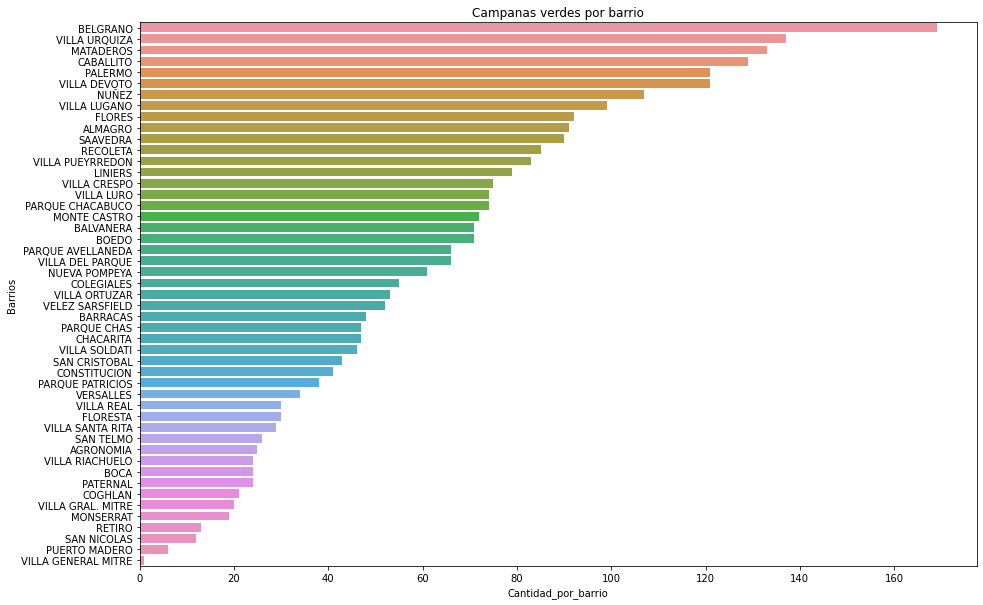

In [65]:
plt.figure(figsize= (15,10))
sns.barplot(y="Barrios", x="Cantidad_por_barrio", data=muestra2).set(title='Campanas verdes por barrio')
plt.show()

# Puntos verdes CABA

En la Ciudad de Buenos Aires contamos los puntos verdes, lugares atendidos por personas con un horario determinado quienes reciben residuos recicables. A continuacion veremos cuantos hay por barrio y como se distribuyen.

In [66]:
#traigo dataset con puntos verdes
url_puntos='https://cdn.buenosaires.gob.ar/datosabiertos/datasets/agencia-de-proteccion-ambiental/puntos-verdes/puntos-verdes.csv'
data_puntos=pd.read_csv(url_puntos)
data_puntos.head(2)

,WKT,id,nombre,direccion,materiales,mas_info,dia_hora,tipo,cooperativ,calle,altura,calle2,barrio,comuna
0,POINT (-58.464634598031 -34.5673114271266),PV-073,PLAZA CASTELLI,CONDE y JURAMENTO,RAEES / Aceite vegetal usado (en botellas cerr...,"Para entregar los materiales, éstos deben esta...",Martes a Sábado de 11 a 17 hs.,Punto Verde Con Atención,Cooperativa de Trabajo Amanecer de los Cartoneros,CONDE,NaN,JURAMENTO,BELGRANO,COMUNA 13
1,POINT (-58.4247575949544 -34.5890926138789),PV-081,PLAZA ARMENIA,MALABIA y NICARAGUA,RAEES / Aceite vegetal usado (en botellas cerr...,"Para entregar los materiales, éstos deben esta...",Martes a Sábado de 11 a 17 hs.,Punto Verde Con Atención,Cooperativa de Provisión de Servicios para Rec...,MALABIA,NaN,NICARAGUA,PALERMO,COMUNA 14


In [67]:
data_filtrado = data_puntos.loc[:,['WKT', 'nombre','barrio','comuna'] ]  
data_filtrado

,WKT,nombre,barrio,comuna
0,POINT (-58.464634598031 -34.5673114271266),PLAZA CASTELLI,BELGRANO,COMUNA 13
1,POINT (-58.4247575949544 -34.5890926138789),PLAZA ARMENIA,PALERMO,COMUNA 14
2,POINT (-58.4683708218154 -34.5470464523292),PLAZA BALCARCE,NUÑEZ,COMUNA 13
3,POINT (-58.5039885340967 -34.5763941135912),PLAZA LEANDRO N ALEM,VILLA PUEYRREDON,COMUNA 12
4,POINT (-58.4834187153287 -34.6296117832603),PLAZA VELEZ SARSFIELD,FLORESTA,COMUNA 10
...,...,...,...,...
75,POINT (-58.4768685819074 -34.5443034591689),PLAZA MAKENNA,SAAVEDRA,COMUNA 12
76,POINT (-58.4770761350183 -34.5500695192027),PARQUE SAAVEDRA 2,SAAVEDRA,COMUNA 12
77,POINT (-58.4060195134656 -34.6136312184285),PLAZA MANZANA 66,BALVANERA,COMUNA 3
78,POINT (-58.3963536828733 -34.629193592969),POLO CIRCO,PARQUE PATRICIOS,COMUNA 4


In [68]:
data_filtrado['longitud']=''
data_filtrado['latitud']=''
data_filtrado['longitud'] = [float(i.split(" ")[1:3][0].replace("(","")) for i in data_filtrado["WKT"]]
data_filtrado['latitud'] = [float(i.split(" ")[1:3][1].replace(")","")) for i in data_filtrado["WKT"]]
data_filtrado.head(2)

,WKT,nombre,barrio,comuna,longitud,latitud
0,POINT (-58.464634598031 -34.5673114271266),PLAZA CASTELLI,BELGRANO,COMUNA 13,-58.464635,-34.567311
1,POINT (-58.4247575949544 -34.5890926138789),PLAZA ARMENIA,PALERMO,COMUNA 14,-58.424758,-34.589093


In [69]:
data_filtrado['barrio'].value_counts()

FLORES                 6
SAAVEDRA               5
BELGRANO               4
PALERMO                4
CABALLITO              4
BALVANERA              3
VILLA URQUIZA          3
MONTE CASTRO           3
LINIERS                3
VERSALLES              2
PARQUE AVELLANEDA      2
LUGANO                 2
PARQUE PATRICIOS       2
COLEGIALES             2
RECOLETA               2
MATADEROS              2
NUÑEZ                  2
BARRACAS               2
SAN CRISTOBAL          2
VILLA PUEYRREDON       2
VELEZ SARSFIELD        2
FLORESTA               2
VILLA DEVOTO           2
VILLA SOLDATI          1
RETIRO                 1
VILLA REAL             1
PARQUE CHACABUCO       1
SAN TELMO              1
LA BOCA                1
POMPEYA                1
CONSTITUCION           1
VILLA OTUZAR           1
VILLA DEL PARQUE       1
BOEDO                  1
VILLA CRESPO           1
PARQUE CHAS            1
VILLA GENERAL MITRE    1
VILLA RIACHUELO        1
CHACARITA              1
ALMAGRO                1


In [70]:
#genero df sobre cantidad de puntos verdes por barrio

muestra = pd.DataFrame({
                      'Cantidad_por_barrio':data_filtrado['barrio'].value_counts()
                      })


In [71]:
muestra.index = data_filtrado['barrio'].value_counts().index

In [72]:
#reseteo el indice

muestra = muestra.reset_index()

muestra.head(2)

,index,Cantidad_por_barrio
0,FLORES,6
1,SAAVEDRA,5


In [73]:
#cambio de nombre para dataframe

muestra.rename(columns= {'index':'Barrios'}, inplace = True)
muestra.head(2)

,Barrios,Cantidad_por_barrio
0,FLORES,6
1,SAAVEDRA,5


# Barplot con Puntos verdes por barrio

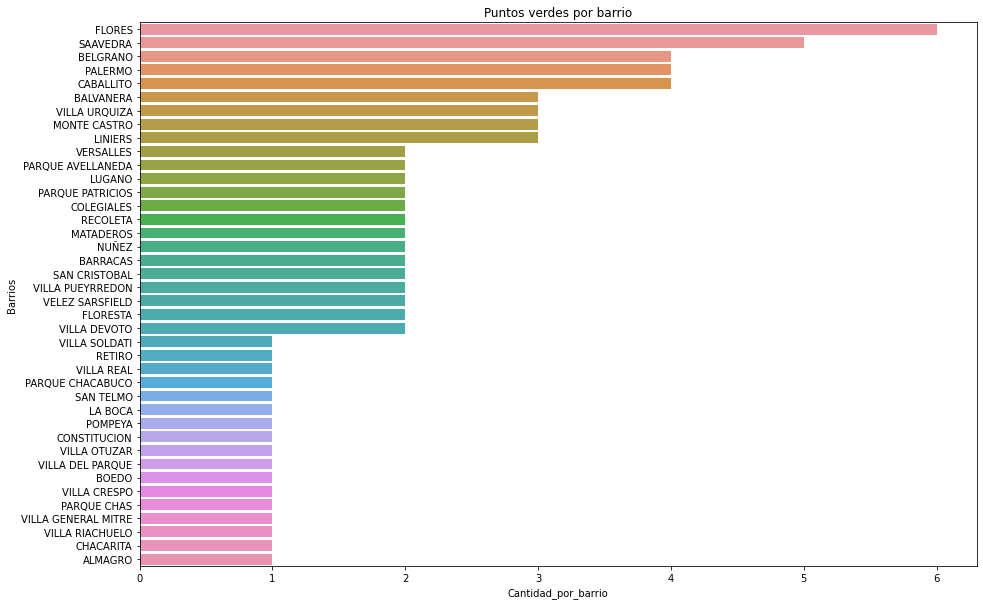

In [74]:
#barplot con cantidad de puntos verdes por barrio
plt.figure(figsize= (15,10))
sns.barplot(y="Barrios", x="Cantidad_por_barrio", data=muestra).set(title='Puntos verdes por barrio')
plt.show()

# Mapa con distribución de campanas verdes y puntos verdes

In [75]:

lat_ini =  -34.6296117832603
long_ini = -58.4834187153287
zoom = 12

map = folium.Map( location=[lat_ini,long_ini]  , zoom_start=zoom  )
marker_cluster = MarkerCluster().add_to(map)


for i in range(data2_filtrado.shape[0]):
  lat_ = data2_filtrado.loc[i,'latitud']
  long_ = data2_filtrado.loc[i,'longitud']
  folium.Marker(  location=[ lat_ , long_ ], icon=folium.Icon(icon='glyphicon-bell',color='green')).add_to(marker_cluster)

for i in range(data_filtrado.shape[0]):
  lat_ = data_filtrado.loc[i,'latitud']
  long_ = data_filtrado.loc[i,'longitud']
  folium.Marker(  location=[ lat_ , long_ ], icon=folium.Icon(icon='glyphicon-trash',color='blue')).add_to(marker_cluster)



map

# Ruido en CABA

In [76]:
#Importamos y definimos el dataset
link_Mapaderuido='https://cdn.buenosaires.gob.ar/datosabiertos//datasets/mapa-del-ruido/mapa_de_ruido_diurno.csv'
data_mapa_ruido=pd.read_csv(link_Mapaderuido)
data_mapa_ruido.head(20)

,wkt,limite_inferior_rango_db,limite_superior_rango_db,comuna,leyenda,rango_db,color,periodo
0,MULTIPOLYGON (((-58.3714231269834 -34.57855223...,30.0,35.0,1,35 dBA o menos,30-35,169 255 115,Diurno
1,MULTIPOLYGON (((-58.3714231269834 -34.57855223...,35.0,40.0,1,35-40 dBA,35-40,76 230 0,Diurno
2,MULTIPOLYGON (((-58.3714231117057 -34.57856621...,40.0,45.0,1,40-45 dBA,40-45,38 115 0,Diurno
3,MULTIPOLYGON (((-58.3719240383553 -34.57857520...,45.0,50.0,1,45-50 dBA,45-50,255 255 0,Diurno
4,MULTIPOLYGON (((-58.3726218651739 -34.57866586...,50.0,55.0,1,50-55 dBA,50-55,254 204 92,Diurno
5,MULTIPOLYGON (((-58.3726217974613 -34.57872863...,55.0,60.0,1,55-60 dBA,55-60,230 152 0,Diurno
6,MULTIPOLYGON (((-58.3729202224756 -34.57883848...,60.0,65.0,1,60-65 dBA,60-65,255 0 0,Diurno
7,MULTIPOLYGON (((-58.3868781702349 -34.57832725...,65.0,70.0,1,65-70 dBA,65-70,115 0 0,Diurno
8,MULTIPOLYGON (((-58.3760498451091 -34.57766206...,70.0,75.0,1,70-75 dBA,70-75,132 0 168,Diurno
9,MULTIPOLYGON (((-58.3760498451091 -34.57766206...,75.0,80.0,1,75-80 dBA,75-80,0 38 255,Diurno


In [77]:
#definimos geojson del mapa de barrio
geojson='https://cdn.buenosaires.gob.ar/datosabiertos//datasets/mapa-del-ruido/mapa_de_ruido_diurno.geojson'

In [78]:
#transformamos los wkt en centroid y luego en longitud y latitud
data_mapa_ruido=gpd.GeoDataFrame(data_mapa_ruido, crs='epsg:4326')
data_mapa_ruido['wkt']=gpd.GeoSeries.from_wkt(data_mapa_ruido['wkt'])
data_mapa_ruido['centro_poligono']=data_mapa_ruido['wkt'].centroid
data_mapa_ruido['centro_poligono_str']=data_mapa_ruido['centro_poligono'].astype(str)
data_mapa_ruido['longitud']=[  float(i.split(' ')[1].replace('(',''))   for i in data_mapa_ruido['centro_poligono_str']]
data_mapa_ruido['latitud']=[  float(i.split(' ')[2].replace(')',''))   for i in data_mapa_ruido['centro_poligono_str']]


<ipython-input-78-01de002ac2f4>:2: FutureWarning: Assigning CRS to a GeoDataFrame without a geometry column is now deprecated and will not be supported in the future.
  data_mapa_ruido=gpd.GeoDataFrame(data_mapa_ruido, crs='epsg:4326')


In [79]:
data_mapa_ruido.head(10)

,wkt,limite_inferior_rango_db,limite_superior_rango_db,comuna,leyenda,rango_db,color,periodo,centro_poligono,centro_poligono_str,longitud,latitud
0,"MULTIPOLYGON (((-58.37142 -34.57855, -58.37150...",30.0,35.0,1,35 dBA o menos,30-35,169 255 115,Diurno,POINT (-58.36355 -34.58784),POINT (-58.36354709939788 -34.58784171652151),-58.363547,-34.587842
1,"MULTIPOLYGON (((-58.37142 -34.57855, -58.37142...",35.0,40.0,1,35-40 dBA,35-40,76 230 0,Diurno,POINT (-58.36392 -34.59623),POINT (-58.36391990085204 -34.59623273173637),-58.363920,-34.596233
2,"MULTIPOLYGON (((-58.37142 -34.57857, -58.37142...",40.0,45.0,1,40-45 dBA,40-45,38 115 0,Diurno,POINT (-58.36582 -34.59906),POINT (-58.36581701626977 -34.59905865069965),-58.365817,-34.599059
3,"MULTIPOLYGON (((-58.37192 -34.57858, -58.37197...",45.0,50.0,1,45-50 dBA,45-50,255 255 0,Diurno,POINT (-58.36520 -34.59597),POINT (-58.36519673715749 -34.59596566270532),-58.365197,-34.595966
4,"MULTIPOLYGON (((-58.37262 -34.57867, -58.37262...",50.0,55.0,1,50-55 dBA,50-55,254 204 92,Diurno,POINT (-58.36849 -34.59496),POINT (-58.36848788493747 -34.59496361684349),-58.368488,-34.594964
5,"MULTIPOLYGON (((-58.37262 -34.57873, -58.37262...",55.0,60.0,1,55-60 dBA,55-60,230 152 0,Diurno,POINT (-58.37416 -34.59455),POINT (-58.37416454457673 -34.59455171902263),-58.374165,-34.594552
6,"MULTIPOLYGON (((-58.37292 -34.57884, -58.37297...",60.0,65.0,1,60-65 dBA,60-65,255 0 0,Diurno,POINT (-58.37476 -34.59637),POINT (-58.37476189653102 -34.59636996530497),-58.374762,-34.596370
7,"MULTIPOLYGON (((-58.38688 -34.57833, -58.38726...",65.0,70.0,1,65-70 dBA,65-70,115 0 0,Diurno,POINT (-58.37468 -34.60194),POINT (-58.37467559583867 -34.60193935072115),-58.374676,-34.601939
8,"MULTIPOLYGON (((-58.37605 -34.57766, -58.37611...",70.0,75.0,1,70-75 dBA,70-75,132 0 168,Diurno,POINT (-58.37594 -34.60587),POINT (-58.37593627396829 -34.60587400738491),-58.375936,-34.605874
9,"MULTIPOLYGON (((-58.37605 -34.57766, -58.37605...",75.0,80.0,1,75-80 dBA,75-80,0 38 255,Diurno,POINT (-58.37838 -34.60897),POINT (-58.37838485751693 -34.608968294299),-58.378385,-34.608968


# Graficos Plotly

In [80]:
DF_FINAL.columns

Index(['barrio', 'poblacion', 'wkt', 'comuna', 'perimetro', 'area',
       'superficie_verde', 'sup_verde/hab', 'sup_verde/sup'],
      dtype='object')

### Top 15 de barrios por superficie verde

In [81]:
px.bar(DF_FINAL.sort_values('superficie_verde',ascending=False)[:15],
       x='barrio',
       y='superficie_verde',
       color='barrio',
       title='Top 15 de barrios por superficie verde'
       )

###Top 15 de barrios por superficie verde por m2

In [82]:
px.bar(DF_FINAL.sort_values('sup_verde/sup',ascending=False)[:15],
       x='barrio',
       y='sup_verde/sup',
       color='barrio',
       title='Top 15 de barrios por superficie verde por m2'
       )

### Top 15 de barrios por superficie verde por habitante

In [83]:
px.bar(DF_FINAL.sort_values('sup_verde/hab',ascending=False)[:15],
       x='barrio',
       y='sup_verde/hab',
       color='barrio',
       title='Top 15 de barrios por superficie verde por habitante'
       )

#Mapas de visualización

In [84]:
import leafmap.foliumap as leafmap
import shapely
import random
from folium.plugins import MarkerCluster

In [85]:
DF_FINAL.head(2)

,barrio,poblacion,wkt,comuna,perimetro,area,superficie_verde,sup_verde/hab,sup_verde/sup
0,AGRONOMIA,13912,"POLYGON ((-58.4771156675186 -34.5951149914833,...",15,6556.17,2122169.34,2833.542,0.20,0.0
1,ALMAGRO,131699,"POLYGON ((-58.4128700313089 -34.6141162515854,...",5,8537.90,4050752.25,9198.799,0.07,0.0


In [86]:
#definimos geojson del mapa de barrio
geojson='https://cdn.buenosaires.gob.ar/datosabiertos/datasets/barrios/barrios.geojson'
#transformamos los wkt en centroid y luego en longitud y latitud
DF_FINAL=gpd.GeoDataFrame(DF_FINAL, crs='epsg:4326')
DF_FINAL['wkt']=gpd.GeoSeries.from_wkt(DF_FINAL['wkt'])
DF_FINAL['centro_poligono']=DF_FINAL['wkt'].centroid
DF_FINAL['centro_poligono_str']=DF_FINAL['centro_poligono'].astype(str)
DF_FINAL['longitud']=[  float(i.split(' ')[1].replace('(',''))   for i in DF_FINAL['centro_poligono_str']]
DF_FINAL['latitud']=[  float(i.split(' ')[2].replace(')',''))   for i in DF_FINAL['centro_poligono_str']]
DF_FINAL.head(2)

<ipython-input-86-1157013e76f2>:4: FutureWarning:

Assigning CRS to a GeoDataFrame without a geometry column is now deprecated and will not be supported in the future.



,barrio,poblacion,wkt,comuna,perimetro,area,superficie_verde,sup_verde/hab,sup_verde/sup,centro_poligono,centro_poligono_str,longitud,latitud
0,AGRONOMIA,13912,"POLYGON ((-58.47712 -34.59511, -58.47788 -34.5...",15,6556.17,2122169.34,2833.542,0.20,0.0,POINT (-58.48867 -34.59294),POINT (-58.48867265990651 -34.59294471940873),-58.488673,-34.592945
1,ALMAGRO,131699,"POLYGON ((-58.41287 -34.61412, -58.41282 -34.6...",5,8537.90,4050752.25,9198.799,0.07,0.0,POINT (-58.42174 -34.60923),POINT (-58.4217445234198 -34.60922725926523),-58.421745,-34.609227


In [87]:
DF_FINAL['superficie_verde_bins']=pd.qcut(DF_FINAL['superficie_verde'],labels=[1,2,3,4],q=4)
DF_FINAL['porcentaje_de_superficie_verde']=DF_FINAL['superficie_verde']/DF_FINAL['superficie_verde'].sum()*100
DF_FINAL.head(2)


,barrio,poblacion,wkt,comuna,perimetro,area,superficie_verde,sup_verde/hab,sup_verde/sup,centro_poligono,centro_poligono_str,longitud,latitud,superficie_verde_bins,porcentaje_de_superficie_verde
0,AGRONOMIA,13912,"POLYGON ((-58.47712 -34.59511, -58.47788 -34.5...",15,6556.17,2122169.34,2833.542,0.20,0.0,POINT (-58.48867 -34.59294),POINT (-58.48867265990651 -34.59294471940873),-58.488673,-34.592945,1,0.018626
1,ALMAGRO,131699,"POLYGON ((-58.41287 -34.61412, -58.41282 -34.6...",5,8537.90,4050752.25,9198.799,0.07,0.0,POINT (-58.42174 -34.60923),POINT (-58.4217445234198 -34.60922725926523),-58.421745,-34.609227,1,0.060469


# Mapa de visualización de i. Espacios verdes, campanas verdes, estaciones de Ecobici y análisis de ruido

In [88]:
geojson

'https://cdn.buenosaires.gob.ar/datosabiertos/datasets/barrios/barrios.geojson'

In [89]:
m=leafmap.Map(center=[-34.6004,-58.4452],zoom=12)

folium.Choropleth(
    geo_data=geojson,
    name="SUPERFICIE VERDE",
    data=DF_FINAL,
    columns=["barrio", "porcentaje_de_superficie_verde"],
    key_on="feature.properties.BARRIO",
    fill_color='BrBG',
    fill_opacity=0.7,
    line_opacity=0.8,
    line_color='Black',
    legend_name="Superficie verde en %",
    overlay=True
    ).add_to(m)

feature_group_barrios = folium.FeatureGroup(name='Barrios',overlay=True,show=False)

for i in range(0,DF_FINAL.shape[0]):
                  popup_2= (DF_FINAL.loc[ i , 'barrio'])+'\nSuperficie verde: ' + str(int(DF_FINAL.loc[ i , 'superficie_verde']))
                  folium.features.Marker(  location=[DF_FINAL.loc[ i , 'latitud'],DF_FINAL.loc[ i , 'longitud'] ],
                                popup=popup_2).add_to(feature_group_barrios)

feature_group_barrios.add_to(m)

icon_create_function_bicis = ''' function (cluster) {
 var childCount = cluster.getChildCount();
 var c = ' marker-cluster-';
 if (childCount < 3) {
   c += 'small';
 } 
 else if (childCount < 10) {
   c += 'medium';
 } 
 else {
   c += 'large';
 }

 return new L.DivIcon({ html: '<div><span>' + childCount + '</span></div>', 
  className: 'marker-cluster' + c, iconSize: new L.Point(40, 40) });
 }
 '''

marker_cluster_bicis = MarkerCluster(icon_create_function=icon_create_function_bicis,name='Estaciones Bici').add_to(m)

for i in range(estaciones_filtrado.shape[0]):
  lat_ = estaciones_filtrado.loc[i,'latitud']
  long_ = estaciones_filtrado.loc[i,'longitud']
  folium.Marker(  location=[ lat_ , long_ ], icon=folium.Icon(icon= 'star',color='black')).add_to(marker_cluster_bicis)

marker_cluster = MarkerCluster(name='Campanas verdes').add_to(m)

for i in range(data2_filtrado.shape[0]):
  lat_ = data2_filtrado.loc[i,'latitud']
  long_ = data2_filtrado.loc[i,'longitud']
  folium.Marker(  location=[ lat_ , long_ ], icon=folium.Icon(icon='glyphicon-trash',color='green')).add_to(marker_cluster)

  marker_cluster_ruido = MarkerCluster(name='Ruido').add_to(m)

for i in range(data_mapa_ruido.shape[0]):
  lat_ = data_mapa_ruido.loc[i,'latitud']
  long_ = data_mapa_ruido.loc[i,'longitud']
  folium.Marker(  location=[ lat_ , long_ ], popup= data_mapa_ruido.loc[i,'rango_db'], icon=folium.Icon(icon= 'glyphicon-volume-up',color='violet')).add_to(marker_cluster_ruido)


folium.LayerControl().add_to(m)

m.to_html(outfile='mapa.html')
m

<ipython-input-89-fdc9fe615337>:63: UserWarning:

color argument of Icon should be one of: {'black', 'green', 'lightgreen', 'cadetblue', 'orange', 'darkgreen', 'darkpurple', 'darkblue', 'lightblue', 'pink', 'gray', 'lightred', 'blue', 'beige', 'purple', 'darkred', 'red', 'white', 'lightgray'}.



##CUADRO PUNTAJES SELECCIONADOS PARA GRÁFICO FINAL

In [90]:
#cuadro de campanas verdes
muestra2


,Barrios,Cantidad_por_barrio,%
0,BELGRANO,169,5.682582
1,VILLA URQUIZA,137,4.606590
2,MATADEROS,133,4.472091
3,CABALLITO,129,4.337592
4,PALERMO,121,4.068594
5,VILLA DEVOTO,121,4.068594
6,NUÑEZ,107,3.597848
7,VILLA LUGANO,99,3.328850
8,FLORES,92,3.093477
9,ALMAGRO,91,3.059852


In [91]:
#cuadro de espacios verdes
data_espacio_verde_barrio

,barrio,superficie_verde,%
0,AGRONOMIA,2833.542,0.018626
1,ALMAGRO,9198.799,0.060469
2,BALVANERA,30755.787,0.202174
3,BARRACAS,225939.635,1.485219
4,BELGRANO,1278224.942,8.402439
5,BOCA,102472.372,0.673604
6,BOEDO,12126.601,0.079714
7,CABALLITO,215874.599,1.419056
8,CHACARITA,93385.211,0.613870
9,COGHLAN,17422.862,0.114530


In [92]:

estacionxbarrio.reset_index(inplace=True)


In [93]:
#cuadro de estaciones
estacionxbarrio

,index,BARRIO
0,PALERMO,12.72
1,RECOLETA,8.33
2,SAN NICOLAS,7.02
3,BALVANERA,5.70
4,BELGRANO,5.26
5,CABALLITO,4.82
6,MONSERRAT,4.39
7,ALMAGRO,3.95
8,VILLA CRESPO,3.95
9,FLORES,3.51


In [94]:
#left join espacio verde y estacion x barrio
Mapa_final=data_espacio_verde_barrio.merge(estacionxbarrio,
                           how='left',
                           left_on='barrio',
                           right_on='index')
Mapa_final.drop('index',axis=1,inplace=True)
Mapa_final.columns=['barrio', 'superficie_verde', '%', 'proporcion_bicicletas']
Mapa_final


,barrio,superficie_verde,%,proporcion_bicicletas
0,AGRONOMIA,2833.542,0.018626,0.44
1,ALMAGRO,9198.799,0.060469,3.95
2,BALVANERA,30755.787,0.202174,5.70
3,BARRACAS,225939.635,1.485219,2.19
4,BELGRANO,1278224.942,8.402439,5.26
5,BOCA,102472.372,0.673604,3.07
6,BOEDO,12126.601,0.079714,1.75
7,CABALLITO,215874.599,1.419056,4.82
8,CHACARITA,93385.211,0.613870,1.75
9,COGHLAN,17422.862,0.114530,1.32


In [95]:
Mapa_final = Mapa_final.drop(['superficie_verde'], axis=1)

In [96]:
Mapa_final2=Mapa_final.merge(muestra2,
                           how='left',
                           left_on='barrio',
                           right_on='Barrios')
Mapa_final2.drop('Barrios',axis=1,inplace=True)

In [97]:
Mapa_final2 = Mapa_final2.drop(['Cantidad_por_barrio'], axis=1)

In [98]:
Mapa_final2.head(2)

,barrio,%_x,proporcion_bicicletas,%_y
0,AGRONOMIA,0.018626,0.44,0.840619
1,ALMAGRO,0.060469,3.95,3.059852


In [99]:
Mapa_final2.rename (columns ={'%_x': 'proporcion_espverdes'}, inplace = True)

In [100]:
Mapa_final2.rename (columns ={'%_y': 'proporcion_campverdes'}, inplace = True)

In [101]:
Mapa_final2.head(2)

,barrio,proporcion_espverdes,proporcion_bicicletas,proporcion_campverdes
0,AGRONOMIA,0.018626,0.44,0.840619
1,ALMAGRO,0.060469,3.95,3.059852


## CUADRO FINAL ESTACIONES DE ECOBICIS

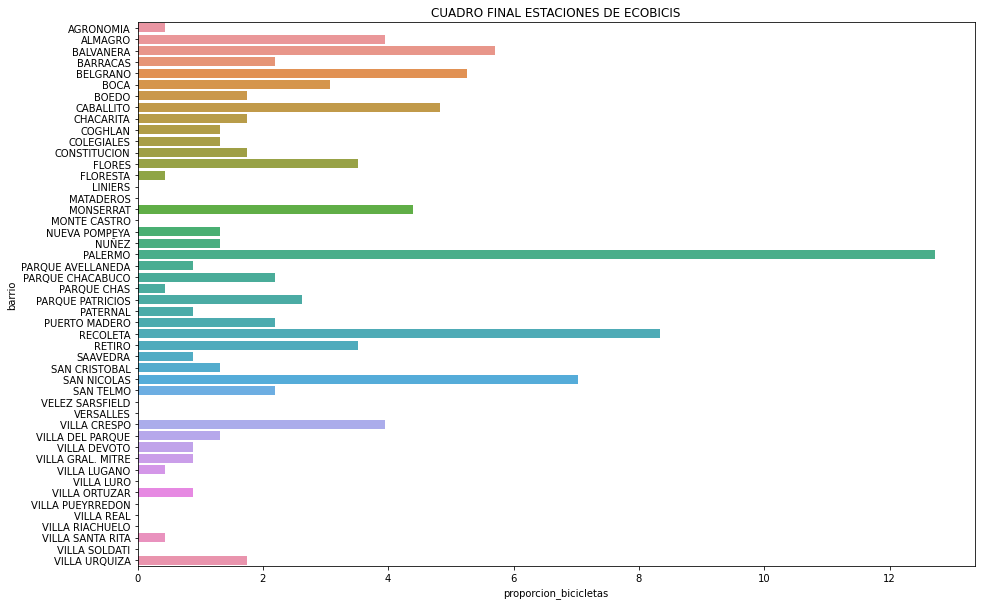

In [102]:
plt.figure(figsize= (15,10))
sns.barplot(y="barrio", x="proporcion_bicicletas", data=Mapa_final2).set(title='CUADRO FINAL ESTACIONES DE ECOBICIS')
plt.show()

## CUADRO FINAL ESPACIOS VERDES

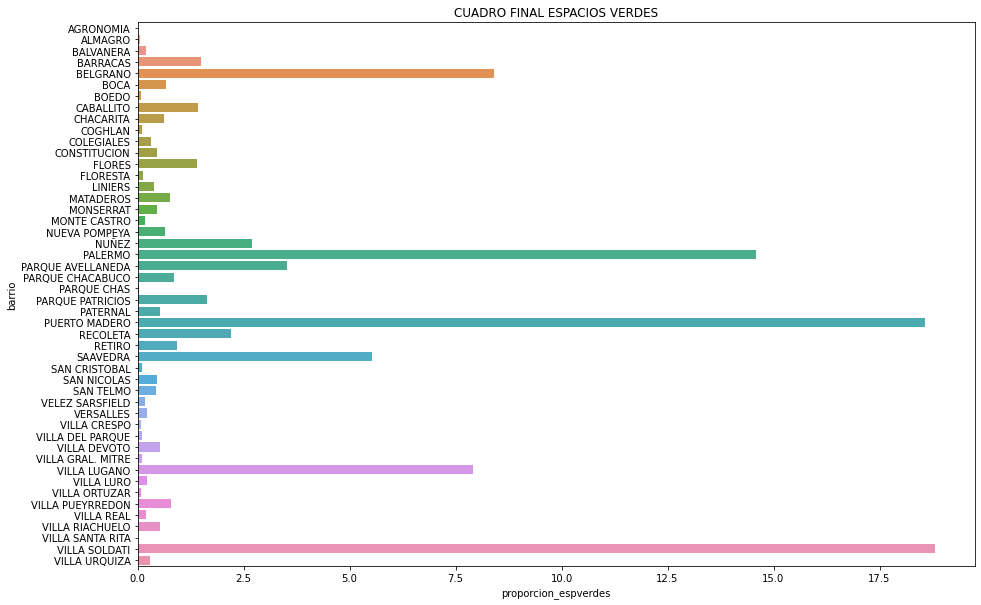

In [103]:
plt.figure(figsize= (15,10))
sns.barplot(y="barrio", x="proporcion_espverdes", data=Mapa_final2).set(title='CUADRO FINAL ESPACIOS VERDES')
plt.show()

# CUADRO FINAL CAMPANAS VERDES

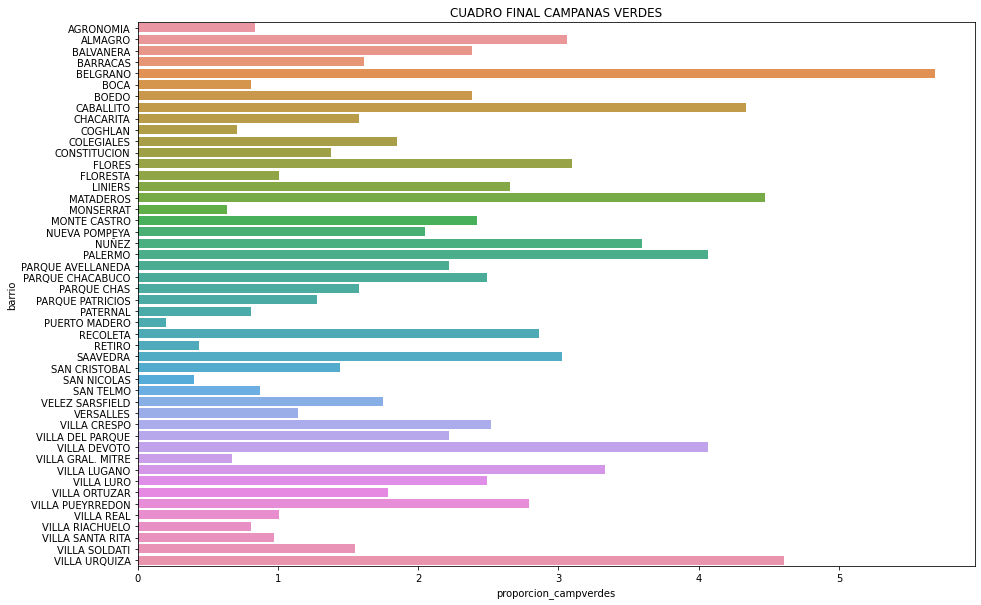

In [104]:
plt.figure(figsize= (15,10))
sns.barplot(y="barrio", x="proporcion_campverdes", data=Mapa_final2).set(title='CUADRO FINAL CAMPANAS VERDES')
plt.show()

# RADAR CHART CON VARIABLES SELECCIONADAS : ESTACIONES DE ECOBICI, CAMPANAS VERDES y ESPACIOS VERDES POR BARRIO

In [105]:
import plotly.graph_objects as go


categorias = [ 'Estaciones de ecobici', 'Campanas verdes','Espacios verdes' ]

fig = go.Figure()


for i in range(Mapa_final2.shape[0]):
  fig.add_trace(go.Scatterpolar(r=Mapa_final2.loc[i,['proporcion_bicicletas','proporcion_campverdes','proporcion_espverdes']].to_list(), 
  theta=categorias, 
  fill='toself', 
  name=Mapa_final2.loc[i,'barrio']))



fig.update_layout(polar=dict(
    radialaxis=dict(
      visible=True,
      range=[0, 20],
    )),
  showlegend=True
  )

fig.update_layout(
    autosize=False,
    width=850,
    height=850,
)

fig.show()


In [106]:
Mapa_final2.sort_values(by=['proporcion_espverdes'],ascending=False)[['barrio','proporcion_espverdes']][:3]

,barrio,proporcion_espverdes
46,VILLA SOLDATI,18.801026
26,PUERTO MADERO,18.570638
20,PALERMO,14.575287


In [107]:
Mapa_final2.sort_values(by=['proporcion_bicicletas'],ascending=False)[['barrio','proporcion_bicicletas']][:3]

,barrio,proporcion_bicicletas
20,PALERMO,12.72
27,RECOLETA,8.33
31,SAN NICOLAS,7.02


In [108]:
Mapa_final2.sort_values(by=['proporcion_campverdes'],ascending=False)[['barrio','proporcion_campverdes']][:6]

,barrio,proporcion_campverdes
4,BELGRANO,5.682582
47,VILLA URQUIZA,4.606590
15,MATADEROS,4.472091
7,CABALLITO,4.337592
37,VILLA DEVOTO,4.068594
20,PALERMO,4.068594


# Cömo eliminar código de un html descargado de una jupyter notebook

# 1) File > Download as html
# 2) Luego ejecutar este chunk: lo que hace es eliminar el código del html que se generó. 
# 3) Luego de ejecutar el código se puede abrir el html descargado y ahora tenemos un informe con todos los gráficos y el texto escrito pero no aparece el código. 

# Ubicación donde haya quedado almacenado el archivo que descargamos como html:
FILE ="C:\\Users\\Ariel\\Downloads\\FINAL.html" #Archivo html del cual se quiere eliminar el código

with open(FILE,encoding='utf-8') as html_file:
    content = html_file.read()
    
# Get rid off prompts and source code
content = content.replace("div.input_area {","div.input_area {\n\tdisplay: none;")    
content = content.replace(".prompt {",".prompt {\n\tdisplay: none;")

f = open(FILE,'w',encoding='utf-8')
f.write(content)
f.close()

# Después de ejecutar este código se puede abrir nuevamente el html y ahora no aparece el código

In [109]:
# para convertir a HTML
#!jupyter nbconvert --no-input --no-prompt --to html "C:\Users\Ariel\Google Drive\EANT\Data Analytics con Python\Trabajo Final\FINAL.ipynb"